In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
!git clone https://github.com/open-mmlab/mmsegmentation.git

Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
     |████████████████████████████████| 46.6 MB 3.5 MB/s 
     |████████████████████████████████| 190 kB 7.7 MB/s 
Cloning into 'mmsegmentation'...
remote: Enumerating objects: 7165, done.
remote: Counting objects: 100% (177/177), done.
remote: Compressing objects: 100% (137/137), done.
remote: Total 7165 (delta 46), reused 153 (delta 40), pack-reused 6988
Receiving objects: 100% (7165/7165), 13.42 MiB | 18.68 MiB/s, done.
Resolving deltas: 100% (5228/5228), done.


In [3]:
import torch

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.11.0+cu113 (Tesla P100-PCIE-16GB)


In [4]:
%cd mmsegmentation

/content/mmsegmentation


In [5]:
from mmseg.apis import inference_segmentor, init_segmentor, show_result_pyplot
import mmcv

In [6]:
import os.path as osp
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [7]:
!mkdir checkpoints
!wget -O //content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth

--2022-05-21 02:18:20--  https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.88.36.72
Connecting to download.openmmlab.com (download.openmmlab.com)|47.88.36.72|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 328290585 (313M) [application/octet-stream]
Saving to: ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’

//content/mmsegment 100%[===================>] 313.08M  10.5MB/s    in 31s     

2022-05-21 02:18:51 (10.2 MB/s) - ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’ saved [328290585/328290585]



In [8]:
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset

classes = ('background', 'building')
palette = [[0, 0, 0], [0, 0, 128]]

@DATASETS.register_module()
class SIADataset(CustomDataset):
  CLASSES = classes
  PALETTE = palette
  def __init__(self, split, **kwargs):
    super().__init__(img_suffix='.png', seg_map_suffix='.png', 
                     split=split, **kwargs)
    assert osp.exists(self.img_dir) and self.split is not None

In [9]:
# config 파일을 설정하고, 다운로드 받은 pretrained 모델을 checkpoint로 설정. 
config_file = '/content/mmsegmentation/configs/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes.py'
checkpoint_file = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

from mmcv import Config

cfg = Config.fromfile(config_file)
print(cfg.pretty_text)

norm_cfg = dict(type='SyncBN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=19,
        norm_cfg=dict(type='SyncBN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(
            type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0)),
    train_cf

In [10]:
cfg.norm_cfg = dict(type='BN', requires_grad=True)
#cfg.model.backbone.norm_cfg = cfg.norm_cfg
cfg.model.decode_head.norm_cfg = cfg.norm_cfg

cfg.model.decode_head.num_classes = 2

cfg.model.decode_head.loss_decode = [dict(type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0),
                                     dict(type='LovaszLoss', loss_weight = 1.0, reduction='none')]

In [11]:
cfg.img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
cfg.crop_size = (512, 512)
cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 2.0)),
    dict(type='RandomCrop', crop_size=cfg.crop_size, cat_max_ratio=0.75),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(type='PhotoMetricDistortion'),
    dict(type='Normalize', **cfg.img_norm_cfg),
    dict(type='Pad', size=cfg.crop_size, pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg']),
]

cfg.val_pipeline = [
                    dict(type='LoadImageFromFile'),
                    dict(
                        type='MultiScaleFlipAug',
                        img_scale=(1024, 1024),
                        flip=False,
                        transforms=[
                                    dict(type='Resize', keep_ratio=True),
                                    dict(type='RandomFlip'),
                                    dict(
                                        type='Normalize',
                                        mean=[123.675, 116.28, 103.53],
                                        std=[58.395, 57.12, 57.375],
                                        to_rgb=True),
                                    dict(type='ImageToTensor', keys=['img']),
                                    dict(type='Collect', keys=['img'])
                                    ]),
                    
]

cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1024, 1024),
        img_ratios=[0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            #dict(type='ResizeToMultiple', size_divisor=32),
            dict(type='RandomFlip'),
            dict(type='Normalize', **cfg.img_norm_cfg),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img']),
        ])
]

In [12]:
cfg.dataset_type = 'SIADataset'
cfg.data_root = '/content/drive/MyDrive/SIA'

cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/building_dataset/img_dir/train'
cfg.data.train.ann_dir = 'Data_set/building_dataset/ann_dir/train'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_train_building.txt'

cfg.data.val.type = 'SIADataset'
cfg.data.val.data_root = '/content/drive/MyDrive/SIA'
cfg.data.val.img_dir = 'Data_set/building_dataset/img_dir/train'
cfg.data.val.ann_dir = 'Data_set/building_dataset/ann_dir/train'
cfg.data.val.pipeline = cfg.test_pipeline
cfg.data.val.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_val_building.txt'

cfg.data.test.type = 'SIADataset'
cfg.data.test.data_root = '/content/drive/MyDrive/SIA'
cfg.data.test.img_dir = 'Data_set/building_dataset/img_dir/val'
cfg.data.test.ann_dir = 'Data_set/building_dataset/ann_dir/val'
cfg.data.test.pipeline = cfg.test_pipeline
cfg.data.test.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/val/up.txt'

<pre><code>cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/building_dataset/img_dir'
cfg.data.train.ann_dir = 'Data_set/building_dataset/ann_dir'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_train_building.txt'
</code></pre>

In [13]:
cfg.load_from = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

# Set up working dir to save files and logs.
cfg.work_dir = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz'

In [14]:
cfg.runner.max_iteTrs = 200
cfg.log_config.interval = 100
cfg.evaluation.interval = 1000  # 모델 학습시 평가를 몇 번째 iteration마다 할 것인지 지정
cfg.checkpoint_config.interval = 1000  # 모델 학습시 학습한 모델을 몇 번째 iteration마다 저장할 것인지 지정

cfg.runner = dict(type='IterBasedRunner', max_iters=20000)  # Iteration으로 동작, Epoch로 동작하게 변경할 수도 있음
# cfg.runner = dict(type='EpochBasedRunner', max_epochs=4000)  # Epoch로 변경
cfg.workflow = [('train', 1)]

# Set seed to facitate reproducing the result
cfg.seed = 0
#set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# Let's have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
norm_cfg = dict(type='BN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=2,
        norm_cfg=dict(type='BN', requires_grad=True),
        align_corners=False,
        loss_decode=[
            dict(type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0),
            d

### 모델 학습

In [15]:
from mmseg.datasets import build_dataset
from mmseg.models import build_segmentor
from mmseg.apis import train_segmentor

# Build the dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_segmentor(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))

# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_segmentor(model, datasets, cfg, distributed=False, validate=True,
                meta=dict(CLASSES=classes, PALETTE=palette))

2022-05-21 02:18:55,279 - mmseg - INFO - Loaded 537 images
/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '
2022-05-21 02:19:10,098 - mmseg - INFO - Loaded 113 images
2022-05-21 02:19:10,102 - mmseg - INFO - load checkpoint from local path: /content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
2022-05-21 02:19:10,527 - mmseg - WARNING - The model and loaded state dict do not match exactly

size mismatch for decode_head.conv_seg.weight: copying a param with shape torch.Size([19, 256, 1, 1]) from checkpoint, the shape in current model is torch.Size([2, 256, 1, 1]).
size mismatch for decode_head.conv_seg.bias: copying a param with 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 478s, ETA:     0s

2022-05-21 02:37:04,089 - mmseg - INFO - per class results:
2022-05-21 02:37:04,091 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 86.13 | 90.26 |
|  building  | 74.75 | 89.98 |
+------------+-------+-------+
2022-05-21 02:37:04,092 - mmseg - INFO - Summary:
2022-05-21 02:37:04,094 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 90.17 | 80.44 | 90.12 |
+-------+-------+-------+
2022-05-21 02:37:04,096 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9017, mIoU: 0.8044, mAcc: 0.9012, IoU.background: 0.8613, IoU.building: 0.7475, Acc.background: 0.9026, Acc.building: 0.8998
2022-05-21 02:37:37,884 - mmseg - INFO - Iter [1100/20000]	lr: 4.154e-05, eta: 5:17:05, time: 5.119, data_time: 4.807, memory: 3323, decode.loss_ce: 0.2769, decode.loss_lovasz: 0.2577, decode.acc_seg: 88.6834, loss: 0.5346
2022-05-21 02:38:09,468 - mmseg - INFO - Iter [1200/20000]	lr: 4.508e-05, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 430s, ETA:     0s

2022-05-21 02:49:40,842 - mmseg - INFO - per class results:
2022-05-21 02:49:40,844 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 88.89 | 93.73 |
|  building  | 78.35 | 88.63 |
+------------+-------+-------+
2022-05-21 02:49:40,845 - mmseg - INFO - Summary:
2022-05-21 02:49:40,846 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.08 | 83.62 | 91.18 |
+-------+-------+-------+
2022-05-21 02:49:40,848 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9208, mIoU: 0.8362, mAcc: 0.9118, IoU.background: 0.8889, IoU.building: 0.7835, Acc.background: 0.9373, Acc.building: 0.8863
2022-05-21 02:50:12,586 - mmseg - INFO - Iter [2100/20000]	lr: 5.370e-05, eta: 4:24:31, time: 4.614, data_time: 4.302, memory: 3323, decode.loss_ce: 0.2337, decode.loss_lovasz: 0.2215, decode.acc_seg: 90.6897, loss: 0.4552
2022-05-21 02:50:46,322 - mmseg - INFO - Iter [2200/20000]	lr: 5.340e-05, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 430s, ETA:     0s

2022-05-21 03:02:16,378 - mmseg - INFO - per class results:
2022-05-21 03:02:16,379 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.61 | 94.54 |
|  building  | 79.43 | 88.49 |
+------------+-------+-------+
2022-05-21 03:02:16,380 - mmseg - INFO - Summary:
2022-05-21 03:02:16,382 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.58 | 84.52 | 91.52 |
+-------+-------+-------+
2022-05-21 03:02:16,384 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9258, mIoU: 0.8452, mAcc: 0.9152, IoU.background: 0.8961, IoU.building: 0.7943, Acc.background: 0.9454, Acc.building: 0.8849
2022-05-21 03:02:48,004 - mmseg - INFO - Iter [3100/20000]	lr: 5.070e-05, eta: 3:57:48, time: 4.613, data_time: 4.302, memory: 3323, decode.loss_ce: 0.2055, decode.loss_lovasz: 0.2006, decode.acc_seg: 91.6918, loss: 0.4061
2022-05-21 03:03:19,554 - mmseg - INFO - Iter [3200/20000]	lr: 5.040e-05, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 430s, ETA:     0s

2022-05-21 03:14:51,908 - mmseg - INFO - per class results:
2022-05-21 03:14:51,910 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.78 | 94.11 |
|  building  | 80.06 | 89.91 |
+------------+-------+-------+
2022-05-21 03:14:51,911 - mmseg - INFO - Summary:
2022-05-21 03:14:51,913 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.75 | 84.92 | 92.01 |
+-------+-------+-------+
2022-05-21 03:14:51,916 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9275, mIoU: 0.8492, mAcc: 0.9201, IoU.background: 0.8978, IoU.building: 0.8006, Acc.background: 0.9411, Acc.building: 0.8991
2022-05-21 03:15:23,548 - mmseg - INFO - Iter [4100/20000]	lr: 4.770e-05, eta: 3:38:00, time: 4.612, data_time: 4.302, memory: 3323, decode.loss_ce: 0.2025, decode.loss_lovasz: 0.1956, decode.acc_seg: 91.9832, loss: 0.3981
2022-05-21 03:15:55,317 - mmseg - INFO - Iter [4200/20000]	lr: 4.740e-05, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 430s, ETA:     0s

2022-05-21 03:27:27,943 - mmseg - INFO - per class results:
2022-05-21 03:27:27,945 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.78 | 95.75 |
|  building  | 79.07 |  86.1 |
+------------+-------+-------+
2022-05-21 03:27:27,946 - mmseg - INFO - Summary:
2022-05-21 03:27:27,950 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.63 | 84.43 | 90.93 |
+-------+-------+-------+
2022-05-21 03:27:27,952 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9263, mIoU: 0.8443, mAcc: 0.9093, IoU.background: 0.8978, IoU.building: 0.7907, Acc.background: 0.9575, Acc.building: 0.8610
2022-05-21 03:27:59,669 - mmseg - INFO - Iter [5100/20000]	lr: 4.470e-05, eta: 3:21:03, time: 4.615, data_time: 4.303, memory: 3323, decode.loss_ce: 0.2146, decode.loss_lovasz: 0.2090, decode.acc_seg: 91.4977, loss: 0.4236
2022-05-21 03:28:31,352 - mmseg - INFO - Iter [5200/20000]	lr: 4.440e-05, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 430s, ETA:     0s

2022-05-21 03:40:04,340 - mmseg - INFO - per class results:
2022-05-21 03:40:04,342 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.58 | 94.91 |
|  building  | 81.34 |  90.0 |
+------------+-------+-------+
2022-05-21 03:40:04,343 - mmseg - INFO - Summary:
2022-05-21 03:40:04,347 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.32 | 85.96 | 92.45 |
+-------+-------+-------+
2022-05-21 03:40:04,349 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9332, mIoU: 0.8596, mAcc: 0.9245, IoU.background: 0.9058, IoU.building: 0.8134, Acc.background: 0.9491, Acc.building: 0.9000
2022-05-21 03:40:36,037 - mmseg - INFO - Iter [6100/20000]	lr: 4.170e-05, eta: 3:05:32, time: 4.614, data_time: 4.303, memory: 3323, decode.loss_ce: 0.2063, decode.loss_lovasz: 0.1956, decode.acc_seg: 92.0829, loss: 0.4019
2022-05-21 03:41:07,710 - mmseg - INFO - Iter [6200/20000]	lr: 4.140e-05, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 430s, ETA:     0s

2022-05-21 03:52:41,097 - mmseg - INFO - per class results:
2022-05-21 03:52:41,098 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.69 | 95.23 |
|  building  | 81.42 | 89.54 |
+------------+-------+-------+
2022-05-21 03:52:41,100 - mmseg - INFO - Summary:
2022-05-21 03:52:41,101 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.39 | 86.06 | 92.39 |
+-------+-------+-------+
2022-05-21 03:52:41,103 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9339, mIoU: 0.8606, mAcc: 0.9239, IoU.background: 0.9069, IoU.building: 0.8142, Acc.background: 0.9523, Acc.building: 0.8954
2022-05-21 03:53:12,632 - mmseg - INFO - Iter [7100/20000]	lr: 3.870e-05, eta: 2:50:50, time: 4.612, data_time: 4.303, memory: 3323, decode.loss_ce: 0.1715, decode.loss_lovasz: 0.1725, decode.acc_seg: 93.2975, loss: 0.3440
2022-05-21 03:53:44,310 - mmseg - INFO - Iter [7200/20000]	lr: 3.840e-05, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 430s, ETA:     0s

2022-05-21 04:05:15,987 - mmseg - INFO - per class results:
2022-05-21 04:05:15,988 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.95 | 95.03 |
|  building  | 82.08 | 90.62 |
+------------+-------+-------+
2022-05-21 04:05:15,989 - mmseg - INFO - Summary:
2022-05-21 04:05:15,991 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 93.6 | 86.51 | 92.82 |
+------+-------+-------+
2022-05-21 04:05:15,994 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9360, mIoU: 0.8651, mAcc: 0.9282, IoU.background: 0.9095, IoU.building: 0.8208, Acc.background: 0.9503, Acc.building: 0.9062
2022-05-21 04:05:49,676 - mmseg - INFO - Iter [8100/20000]	lr: 3.570e-05, eta: 2:36:41, time: 4.633, data_time: 4.322, memory: 3323, decode.loss_ce: 0.1664, decode.loss_lovasz: 0.1655, decode.acc_seg: 93.4299, loss: 0.3319
2022-05-21 04:06:21,269 - mmseg - INFO - Iter [8200/20000]	lr: 3.540e-05, eta: 2:3

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 430s, ETA:     0s

2022-05-21 04:17:52,135 - mmseg - INFO - per class results:
2022-05-21 04:17:52,137 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.77 | 95.14 |
|  building  | 81.63 | 89.93 |
+------------+-------+-------+
2022-05-21 04:17:52,138 - mmseg - INFO - Summary:
2022-05-21 04:17:52,139 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 93.45 | 86.2 | 92.53 |
+-------+------+-------+
2022-05-21 04:17:52,142 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9345, mIoU: 0.8620, mAcc: 0.9253, IoU.background: 0.9077, IoU.building: 0.8163, Acc.background: 0.9514, Acc.building: 0.8993
2022-05-21 04:18:23,755 - mmseg - INFO - Iter [9100/20000]	lr: 3.270e-05, eta: 2:22:47, time: 4.612, data_time: 4.301, memory: 3323, decode.loss_ce: 0.1787, decode.loss_lovasz: 0.1774, decode.acc_seg: 92.8609, loss: 0.3561
2022-05-21 04:18:57,575 - mmseg - INFO - Iter [9200/20000]	lr: 3.240e-05, eta: 2:2

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 430s, ETA:     0s

2022-05-21 04:30:29,768 - mmseg - INFO - per class results:
2022-05-21 04:30:29,770 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.24 | 95.49 |
|  building  | 82.49 | 90.27 |
+------------+-------+-------+
2022-05-21 04:30:29,771 - mmseg - INFO - Summary:
2022-05-21 04:30:29,774 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 93.8 | 86.87 | 92.88 |
+------+-------+-------+
2022-05-21 04:30:29,777 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9380, mIoU: 0.8687, mAcc: 0.9288, IoU.background: 0.9124, IoU.building: 0.8249, Acc.background: 0.9549, Acc.building: 0.9027
2022-05-21 04:31:01,384 - mmseg - INFO - Iter [10100/20000]	lr: 2.970e-05, eta: 2:09:14, time: 4.613, data_time: 4.302, memory: 3323, decode.loss_ce: 0.1709, decode.loss_lovasz: 0.1697, decode.acc_seg: 93.2196, loss: 0.3406
2022-05-21 04:31:33,337 - mmseg - INFO - Iter [10200/20000]	lr: 2.940e-05, eta: 2

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 430s, ETA:     0s

2022-05-21 04:43:09,074 - mmseg - INFO - per class results:
2022-05-21 04:43:09,076 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.25 | 96.24 |
|  building  | 82.11 | 88.56 |
+------------+-------+-------+
2022-05-21 04:43:09,077 - mmseg - INFO - Summary:
2022-05-21 04:43:09,080 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 93.76 | 86.68 | 92.4 |
+-------+-------+------+
2022-05-21 04:43:09,083 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9376, mIoU: 0.8668, mAcc: 0.9240, IoU.background: 0.9125, IoU.building: 0.8211, Acc.background: 0.9624, Acc.building: 0.8856
2022-05-21 04:43:40,907 - mmseg - INFO - Iter [11100/20000]	lr: 2.670e-05, eta: 1:55:51, time: 4.616, data_time: 4.304, memory: 3323, decode.loss_ce: 0.1662, decode.loss_lovasz: 0.1607, decode.acc_seg: 93.5045, loss: 0.3269
2022-05-21 04:44:12,680 - mmseg - INFO - Iter [11200/20000]	lr: 2.640e-05, eta: 1

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 430s, ETA:     0s

2022-05-21 04:55:46,297 - mmseg - INFO - per class results:
2022-05-21 04:55:46,299 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.14 | 95.25 |
|  building  | 82.39 | 90.57 |
+------------+-------+-------+
2022-05-21 04:55:46,300 - mmseg - INFO - Summary:
2022-05-21 04:55:46,303 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.74 | 86.76 | 92.91 |
+-------+-------+-------+
2022-05-21 04:55:46,305 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9374, mIoU: 0.8676, mAcc: 0.9291, IoU.background: 0.9114, IoU.building: 0.8239, Acc.background: 0.9525, Acc.building: 0.9057
2022-05-21 04:56:18,129 - mmseg - INFO - Iter [12100/20000]	lr: 2.370e-05, eta: 1:42:35, time: 4.616, data_time: 4.303, memory: 3323, decode.loss_ce: 0.1570, decode.loss_lovasz: 0.1582, decode.acc_seg: 93.8591, loss: 0.3152
2022-05-21 04:56:50,062 - mmseg - INFO - Iter [12200/20000]	lr: 2.340e-05, e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 430s, ETA:     0s

2022-05-21 05:08:24,417 - mmseg - INFO - per class results:
2022-05-21 05:08:24,418 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.24 |  95.4 |
|  building  | 82.52 | 90.46 |
+------------+-------+-------+
2022-05-21 05:08:24,419 - mmseg - INFO - Summary:
2022-05-21 05:08:24,423 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 93.8 | 86.88 | 92.93 |
+------+-------+-------+
2022-05-21 05:08:24,424 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9380, mIoU: 0.8688, mAcc: 0.9293, IoU.background: 0.9124, IoU.building: 0.8252, Acc.background: 0.9540, Acc.building: 0.9046
2022-05-21 05:08:56,139 - mmseg - INFO - Iter [13100/20000]	lr: 2.070e-05, eta: 1:29:24, time: 4.614, data_time: 4.302, memory: 3323, decode.loss_ce: 0.1535, decode.loss_lovasz: 0.1569, decode.acc_seg: 93.8136, loss: 0.3104
2022-05-21 05:09:27,906 - mmseg - INFO - Iter [13200/20000]	lr: 2.040e-05, eta: 1

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 430s, ETA:     0s

2022-05-21 05:21:03,162 - mmseg - INFO - per class results:
2022-05-21 05:21:03,163 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.27 | 95.04 |
|  building  | 82.79 | 91.38 |
+------------+-------+-------+
2022-05-21 05:21:03,167 - mmseg - INFO - Summary:
2022-05-21 05:21:03,168 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.85 | 87.03 | 93.21 |
+-------+-------+-------+
2022-05-21 05:21:03,170 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9385, mIoU: 0.8703, mAcc: 0.9321, IoU.background: 0.9127, IoU.building: 0.8279, Acc.background: 0.9504, Acc.building: 0.9138
2022-05-21 05:21:35,098 - mmseg - INFO - Iter [14100/20000]	lr: 1.770e-05, eta: 1:16:19, time: 4.619, data_time: 4.305, memory: 3323, decode.loss_ce: 0.1550, decode.loss_lovasz: 0.1531, decode.acc_seg: 93.6772, loss: 0.3081
2022-05-21 05:22:06,978 - mmseg - INFO - Iter [14200/20000]	lr: 1.740e-05, e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 430s, ETA:     0s

2022-05-21 05:33:39,387 - mmseg - INFO - per class results:
2022-05-21 05:33:39,389 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.21 | 96.44 |
|  building  |  81.9 |  88.0 |
+------------+-------+-------+
2022-05-21 05:33:39,391 - mmseg - INFO - Summary:
2022-05-21 05:33:39,392 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.71 | 86.55 | 92.22 |
+-------+-------+-------+
2022-05-21 05:33:39,394 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9371, mIoU: 0.8655, mAcc: 0.9222, IoU.background: 0.9121, IoU.building: 0.8190, Acc.background: 0.9644, Acc.building: 0.8800
2022-05-21 05:34:13,266 - mmseg - INFO - Iter [15100/20000]	lr: 1.470e-05, eta: 1:03:17, time: 4.637, data_time: 4.325, memory: 3323, decode.loss_ce: 0.1486, decode.loss_lovasz: 0.1518, decode.acc_seg: 93.9307, loss: 0.3005
2022-05-21 05:34:45,341 - mmseg - INFO - Iter [15200/20000]	lr: 1.440e-05, e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 430s, ETA:     0s

2022-05-21 05:46:17,212 - mmseg - INFO - per class results:
2022-05-21 05:46:17,213 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.34 | 94.69 |
|  building  | 83.11 | 92.34 |
+------------+-------+-------+
2022-05-21 05:46:17,216 - mmseg - INFO - Summary:
2022-05-21 05:46:17,217 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.93 | 87.22 | 93.51 |
+-------+-------+-------+
2022-05-21 05:46:17,220 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9393, mIoU: 0.8722, mAcc: 0.9351, IoU.background: 0.9134, IoU.building: 0.8311, Acc.background: 0.9469, Acc.building: 0.9234
2022-05-21 05:46:49,223 - mmseg - INFO - Iter [16100/20000]	lr: 1.170e-05, eta: 0:50:17, time: 4.618, data_time: 4.304, memory: 3323, decode.loss_ce: 0.1579, decode.loss_lovasz: 0.1535, decode.acc_seg: 93.8417, loss: 0.3114
2022-05-21 05:47:23,181 - mmseg - INFO - Iter [16200/20000]	lr: 1.140e-05, e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 431s, ETA:     0s

2022-05-21 05:58:56,228 - mmseg - INFO - per class results:
2022-05-21 05:58:56,229 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  91.5 | 95.35 |
|  building  | 83.13 | 91.21 |
+------------+-------+-------+
2022-05-21 05:58:56,230 - mmseg - INFO - Summary:
2022-05-21 05:58:56,232 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.01 | 87.32 | 93.28 |
+-------+-------+-------+
2022-05-21 05:58:56,234 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9401, mIoU: 0.8732, mAcc: 0.9328, IoU.background: 0.9150, IoU.building: 0.8313, Acc.background: 0.9535, Acc.building: 0.9121
2022-05-21 05:59:27,891 - mmseg - INFO - Iter [17100/20000]	lr: 8.703e-06, eta: 0:37:21, time: 4.629, data_time: 4.318, memory: 3323, decode.loss_ce: 0.1670, decode.loss_lovasz: 0.1622, decode.acc_seg: 93.5058, loss: 0.3292
2022-05-21 06:00:01,753 - mmseg - INFO - Iter [17200/20000]	lr: 8.403e-06, e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 430s, ETA:     0s

2022-05-21 06:11:36,276 - mmseg - INFO - per class results:
2022-05-21 06:11:36,278 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.61 | 95.78 |
|  building  | 83.13 | 90.46 |
+------------+-------+-------+
2022-05-21 06:11:36,278 - mmseg - INFO - Summary:
2022-05-21 06:11:36,282 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.06 | 87.37 | 93.12 |
+-------+-------+-------+
2022-05-21 06:11:36,283 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9406, mIoU: 0.8737, mAcc: 0.9312, IoU.background: 0.9161, IoU.building: 0.8313, Acc.background: 0.9578, Acc.building: 0.9046
2022-05-21 06:12:08,249 - mmseg - INFO - Iter [18100/20000]	lr: 5.703e-06, eta: 0:24:27, time: 4.618, data_time: 4.304, memory: 3323, decode.loss_ce: 0.1400, decode.loss_lovasz: 0.1408, decode.acc_seg: 94.2952, loss: 0.2808
2022-05-21 06:12:40,005 - mmseg - INFO - Iter [18200/20000]	lr: 5.403e-06, e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 430s, ETA:     0s

2022-05-21 06:24:14,436 - mmseg - INFO - per class results:
2022-05-21 06:24:14,438 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.59 |  95.5 |
|  building  | 83.23 | 91.06 |
+------------+-------+-------+
2022-05-21 06:24:14,439 - mmseg - INFO - Summary:
2022-05-21 06:24:14,443 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.07 | 87.41 | 93.28 |
+-------+-------+-------+
2022-05-21 06:24:14,445 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9407, mIoU: 0.8741, mAcc: 0.9328, IoU.background: 0.9159, IoU.building: 0.8323, Acc.background: 0.9550, Acc.building: 0.9106
2022-05-21 06:24:45,880 - mmseg - INFO - Iter [19100/20000]	lr: 2.703e-06, eta: 0:11:34, time: 4.612, data_time: 4.303, memory: 3323, decode.loss_ce: 0.1328, decode.loss_lovasz: 0.1398, decode.acc_seg: 94.6555, loss: 0.2726
2022-05-21 06:25:17,421 - mmseg - INFO - Iter [19200/20000]	lr: 2.403e-06, e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 430s, ETA:     0s

2022-05-21 06:36:50,393 - mmseg - INFO - per class results:
2022-05-21 06:36:50,395 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.62 | 95.54 |
|  building  | 83.28 | 91.04 |
+------------+-------+-------+
2022-05-21 06:36:50,397 - mmseg - INFO - Summary:
2022-05-21 06:36:50,401 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.09 | 87.45 | 93.29 |
+-------+-------+-------+
2022-05-21 06:36:50,402 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9409, mIoU: 0.8745, mAcc: 0.9329, IoU.background: 0.9162, IoU.building: 0.8328, Acc.background: 0.9554, Acc.building: 0.9104


### 모델 결과 시각화

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


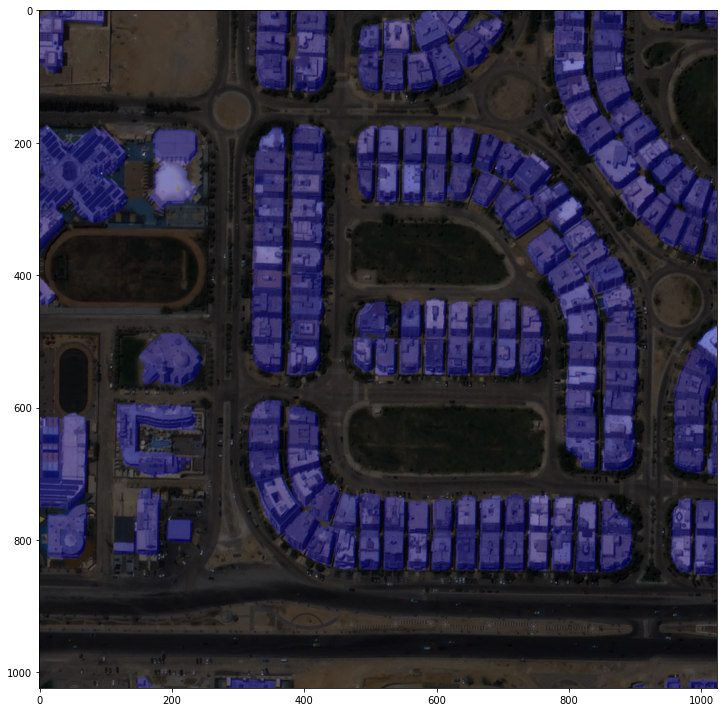

In [16]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00051_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


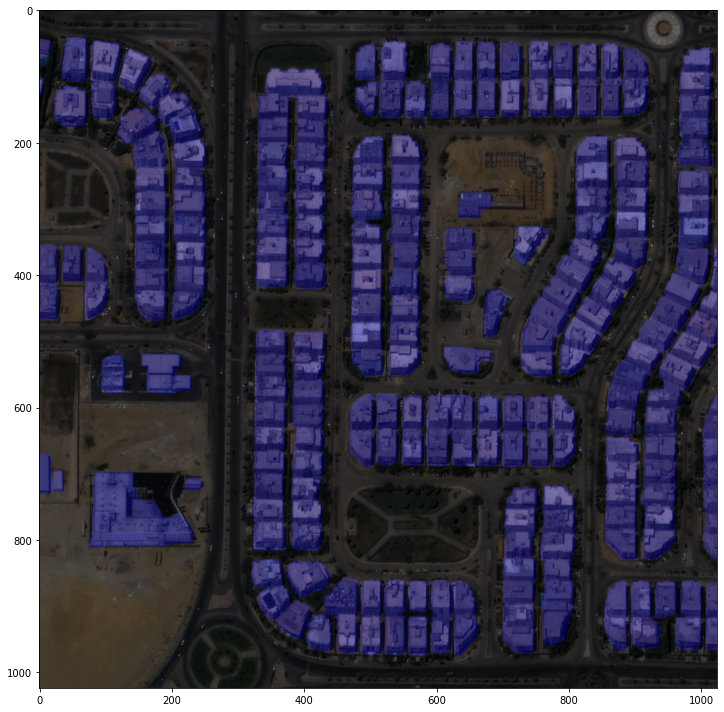

In [17]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00126_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


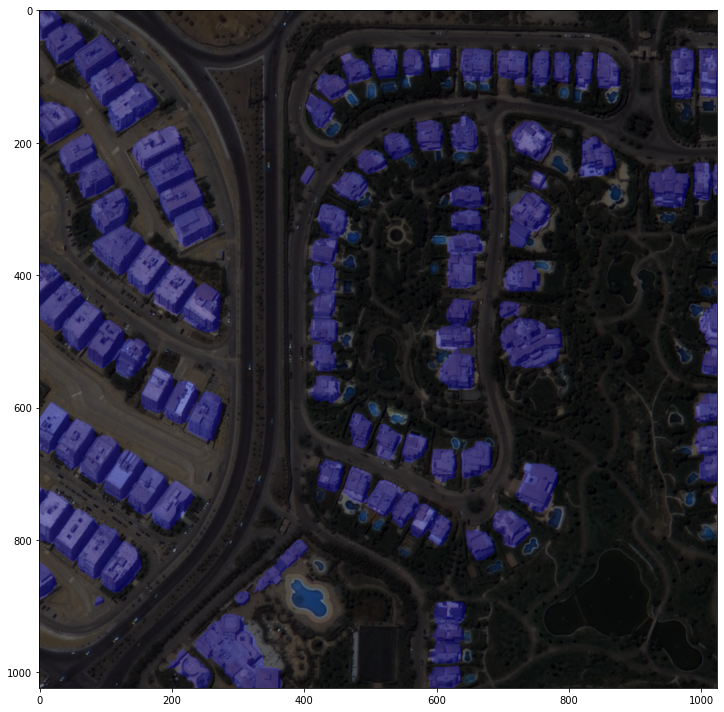

In [18]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00226_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


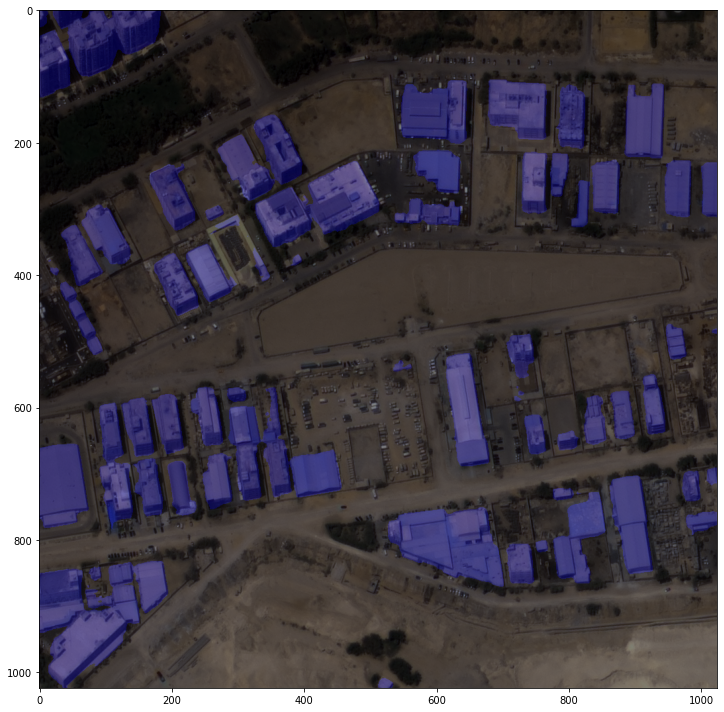

In [19]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00333_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


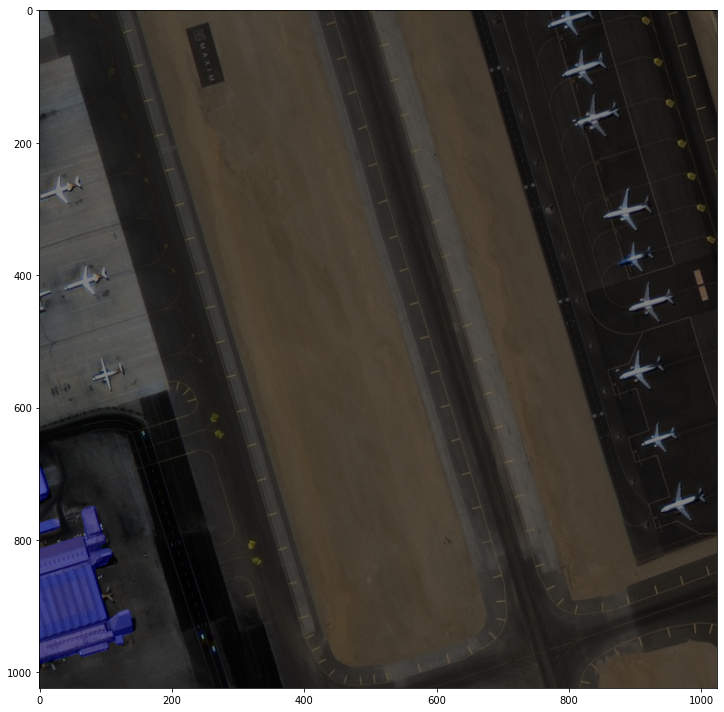

In [20]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00697_PS3_K3A_NIA0277.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


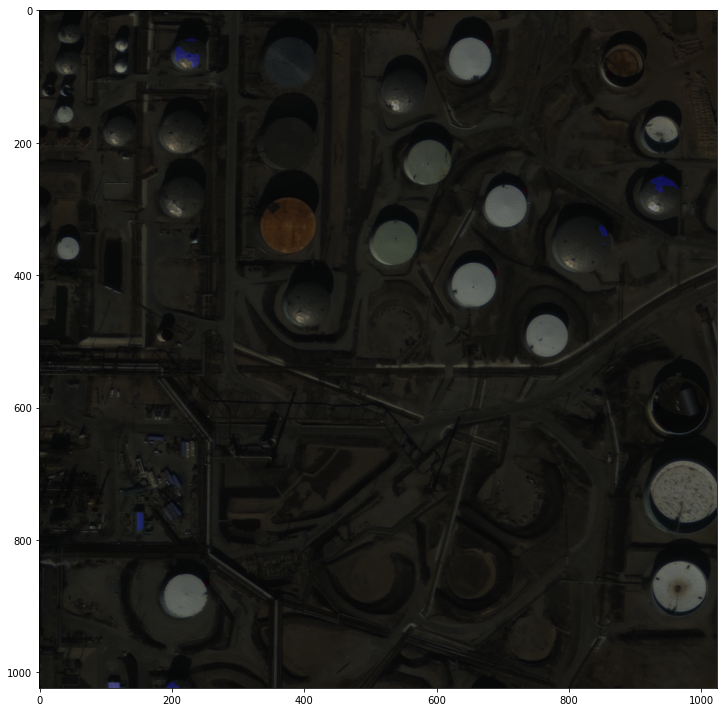

In [21]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD04404_PS3_K3A_NIA0378.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


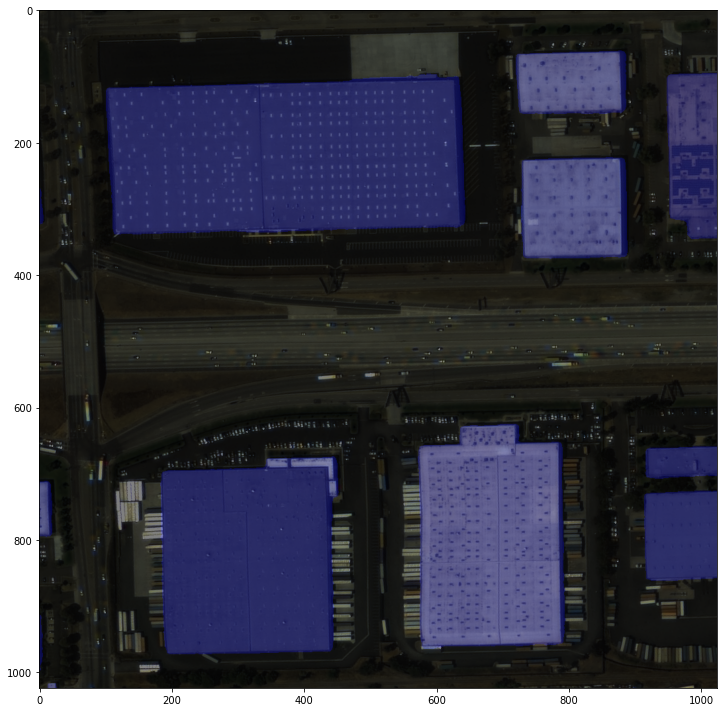

In [22]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD10921_PS3_K3A_NIA0389.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


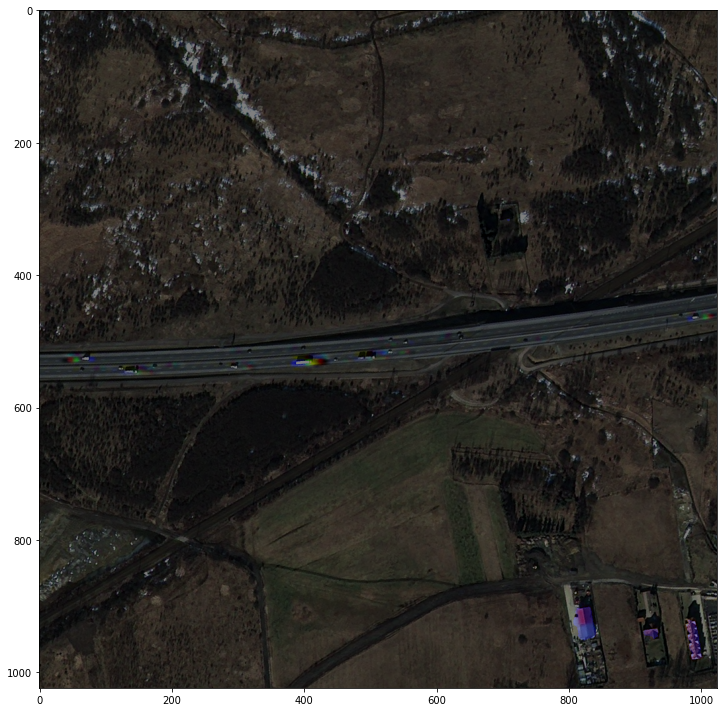

In [23]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ00176_PS3_K3_NIA0081.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


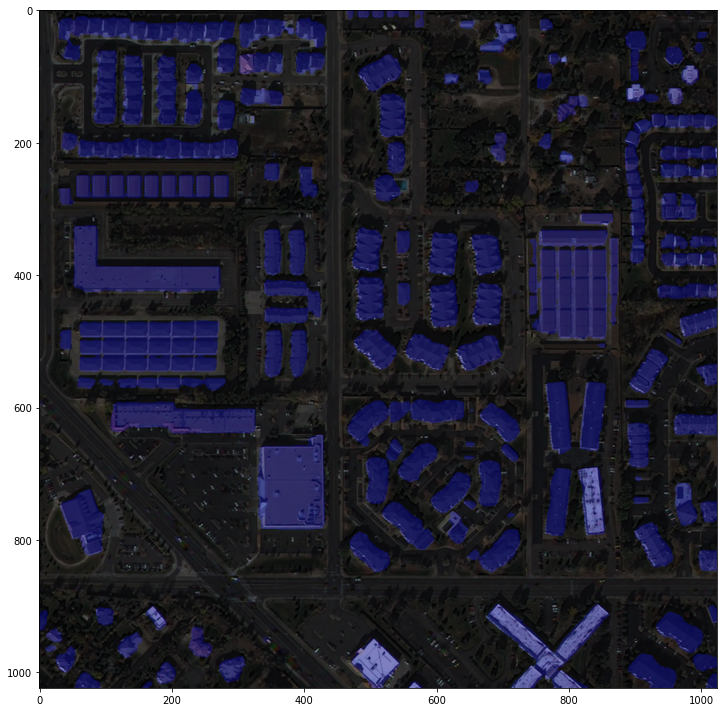

In [24]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ01050_PS3_K3_NIA0089.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


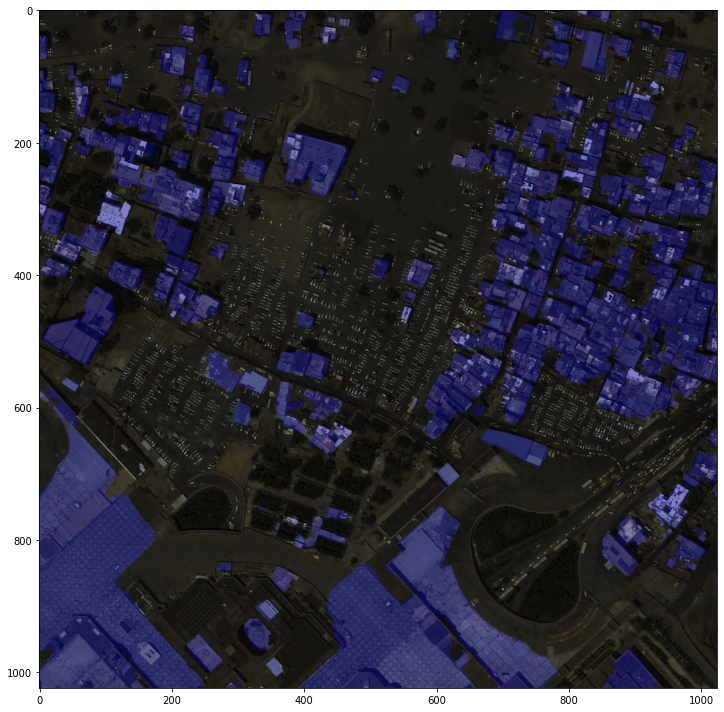

In [25]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ03670_PS3_K3A_NIA0153.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

#### 네이버 지도 이미지로 테스트

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


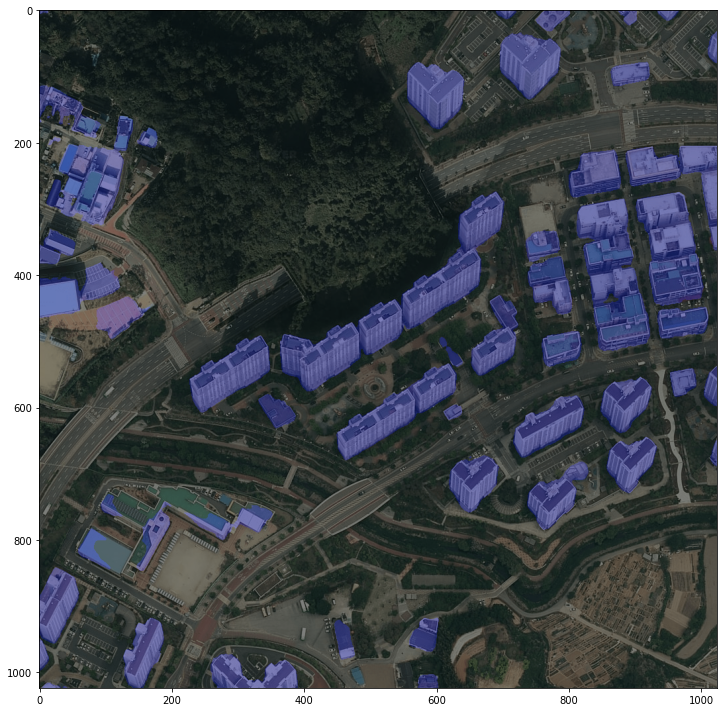

In [26]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0000.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


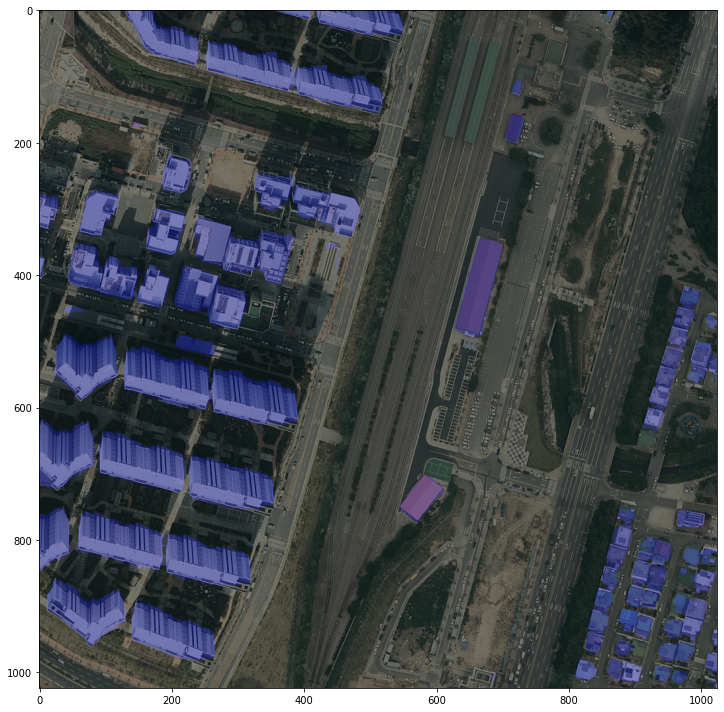

In [27]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0001.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


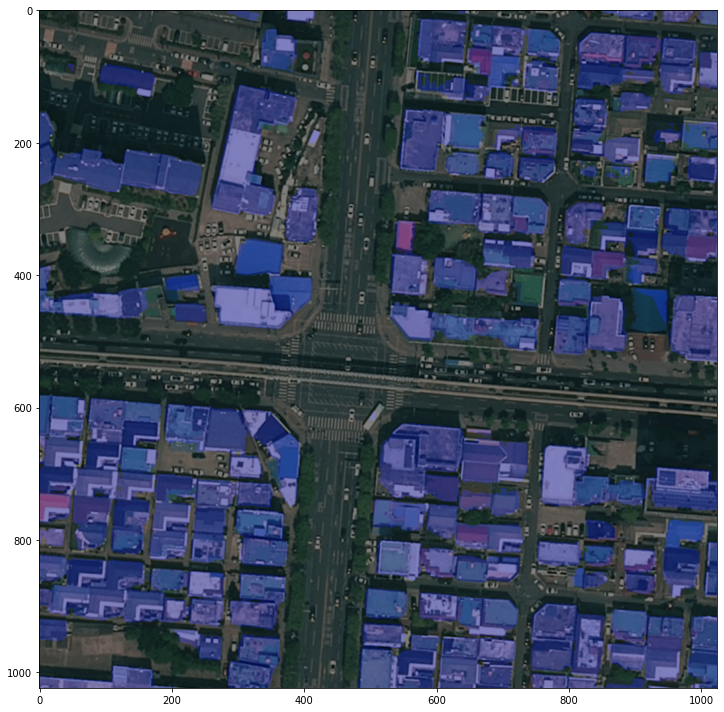

In [28]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0002.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


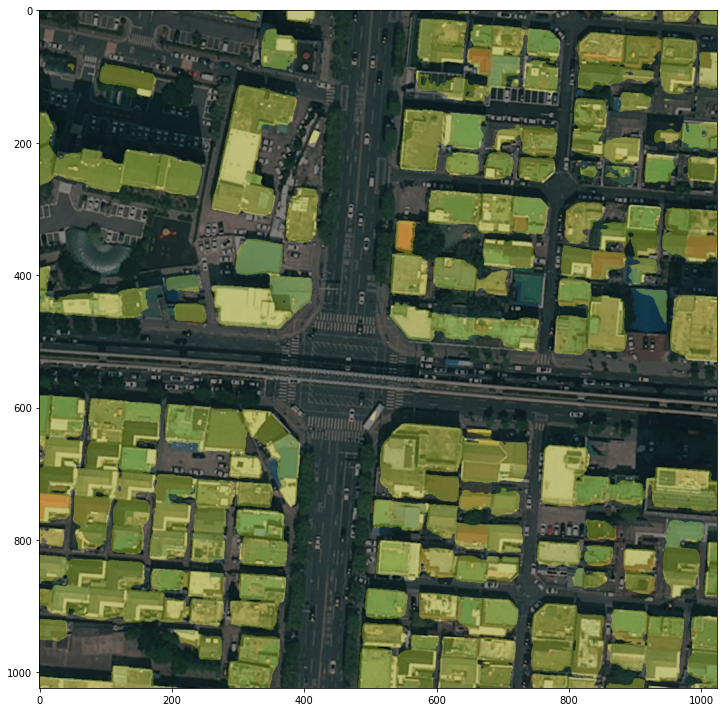

In [29]:
palette_1 = [[0, 0, 0], [128, 128, 0]]
show_result_pyplot(model_ckpt, img, result, palette_1)
